Assignment on Fashion-MNIST - Section B

B2.1 Data loading and inspection [2 marks] - Part A

In [1]:
#Import needed packages
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd
import datetime

def conv_calc(i,f,p,s):
    return (i-f + 2*p)/s + 1

#Set manual seed as UCARD number
seed = 170163679
torch.manual_seed(seed)
np.random.seed(seed)

#Set a batch size, this is 0.2% of training data
#Ideally I wanted this higher but I had memory errors
batchSize=10
#Create a transformer to normalize the image
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
#Load the training data
trainset = datasets.FashionMNIST(root='./data', train=True,
                                        download=True, transform=transform)

trainloader = torch.utils.data.DataLoader(trainset, batch_size=batchSize,
                                          shuffle=True, num_workers=2)

#This trainloader doesn't shuffle so it can be used for working out training accuracy
trainloader_ns = torch.utils.data.DataLoader(trainset, batch_size=batchSize,
                                          shuffle=False, num_workers=2)
#Load the test data
testset = datasets.FashionMNIST(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=batchSize, 
                                         shuffle=False, num_workers=2)
#Create the class labels
classes = ('T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot')
print(trainset)
print(testset)

Dataset FashionMNIST
    Number of datapoints: 60000
    Root location: ./data
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=(0.5,), std=(0.5,))
           )
Dataset FashionMNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=(0.5,), std=(0.5,))
           )


B2.1 Data loading and inspection [2 marks] - Part B

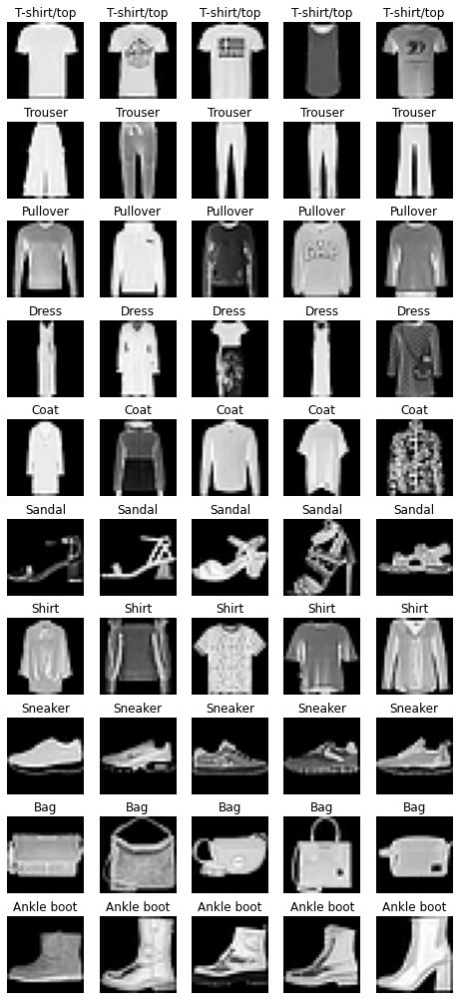

In [2]:
#Create figure
fig = plt.figure(figsize=(8,18))
columns = 5
rows = 10

#Set some lists to append to
image_list = []
class_list = []

#Loop thorugh each class
for cl in classes:
    class_count = 0
    #While we haven't found 5 of that class, loop and add images
    while class_count < 5:
        img_xy = np.random.randint(len(trainset))
        if cl == classes[trainset[img_xy][1]]:
            img = trainset[img_xy][0][0,:,:]
            image_list.append(img)
            class_list.append(cl)
            class_count += 1

#Display the images
for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    plt.axis('off')
    plt.title(class_list[i-1])
    plt.imshow(image_list[i-1], cmap='gray')
plt.show()

B2.3 Logistic Regression [4 marks]

I am going to start by defining a LogistRegression model with PyTorch

In [3]:
class LogisticRegression(torch.nn.Module):

    #Create the model with one basic layer, 10 class outputs
    def __init__(self): 
        super(LogisticRegression, self).__init__()
        self.linear = torch.nn.Linear(28*28, 10)     
    
    #Create our forward pass learning step
    def forward(self, x):
        #Flatten the image
        x = x.reshape(-1, 784)
        y_pred = torch.sigmoid(self.linear(x))
        return y_pred

    #Train the model with the batch
    def train(self, batch, criterion):
        #Split the batch
        images, labels = batch
        #Generate the predictions
        y_pred = self(images)
        #Calcualte our loss
        loss = criterion(y_pred, labels)
        return loss

    #Get the predictions of a dataset using the model
    def get_all_preds(self, data):
        with torch.no_grad():
            total_preds = []
            for batch in data:
                images, labels = batch
                y_pred = self(images)
                _, predicted = torch.max(y_pred, 1)
                predicted = predicted.numpy()
                total_preds.append(predicted)
        return np.concatenate(total_preds).ravel()


Now I am going to create a few methods that will allow me to train, predict and evaluate all future models

In [4]:
#Train the model and return it for use
def fit(model, criterion, epochs, optimizer, x_data):
    running_loss = 0.0
    time1 = datetime.datetime.now()
    for epoch in range(epochs):
        for batch in x_data:
            optimizer.zero_grad()
            #Train the model
            loss = model.train(batch, criterion)
            #Backprop
            loss.backward()
            optimizer.step()
            # print statistics
            running_loss += loss.item()
        print(running_loss)
        running_loss = 0.0
    print('Finished Training!')

    #Calculate time taken
    time2 = datetime.datetime.now()
    time_taken = time2-time1
    time_list.append(time_taken)
    print("M3 - Time taken to train is:", (time_taken))

    #Calcualte the number of model params
    model_parameters = filter(lambda p: p.requires_grad, model.parameters())
    params_count = sum([np.prod(p.size()) for p in model_parameters])
    print("M4 - Total trainable params is:", params_count)
    params_count_list.append(params_count)
    return model
    
#Given two sets of labels as numpy arrays, give accuracy score
def accuracy(predictions, labels):
    total = 0
    correct = 0

    for i in range(predictions.shape[0]):
        if predictions[i] == labels[i]:
            correct += 1
        total += 1
    acc_str = "The accuracy is: " +  str((correct/total)*100) + "%"
    return acc_str

#Given two sets of labels as numpy arrays, create and show a CM
def conf_matrix(ground_truth, predictions):
    cm = confusion_matrix(ground_truth, predictions)

    df_cm = pd.DataFrame(cm, classes, classes)
    plt.figure(figsize=(10,7))
    sn.set(font_scale=1.4) # for label size
    sn.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='g') # font size

    plt.show()

#Create some arrays for the bar charts later
acc_train_list = []
acc_test_list = []
time_list = []
params_count_list = []

B2.3 Logistic regression [4 marks] - Part A

Now above I have created all my methods needed I will generate the results asked for using them.

10309.851772904396
9886.859091162682
9788.704134702682
9734.499116301537
9698.820172429085
Finished Training!
M3 - Time taken to train is: 0:00:39.907935
M4 - Total trainable params is: 7850
M1 The accuracy is: 79.43666666666667%
M2 The accuracy is: 78.42%


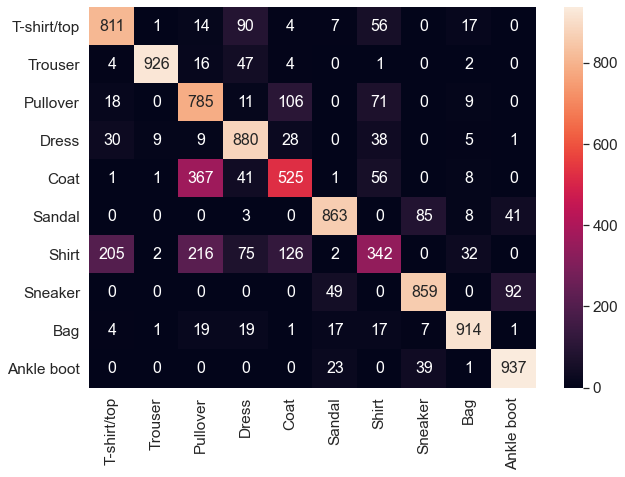

In [5]:
#Create the class
LR = LogisticRegression()
#Set my optimizer as Stocastic Gradient Descent and set hyper params
optimizerLR = optim.SGD(LR.parameters(), lr=0.001, momentum=0.9)
#Set the criterion
criterionLR = nn.CrossEntropyLoss()

#Train the model
epochs = 5
train_model = fit(LR, criterionLR, epochs, optimizerLR,trainloader)

#Get the predictions needed for results
train_output = train_model.get_all_preds(trainloader_ns)
test_output = train_model.get_all_preds(testloader)

#Get ground truth labels
x_true = (trainset.targets).numpy()
y_true = (testset.targets).numpy()

#Print asked for results
train_acc = accuracy(train_output,x_true)
test_acc = accuracy(test_output,y_true)
print("M1", train_acc)
print("M2", test_acc)

#print Confusion Matrix
conf_matrix(y_true, test_output)

acc_train_list.append(train_acc)
acc_test_list.append(test_acc)

B2.3 Logistic regression [4 marks] - Part B

10307.99224960804
9902.575408697128
9813.041888237
9764.778627157211
9733.885185599327
Finished Training!
M3 - Time taken to train is: 0:00:39.370376
M4 - Total trainable params is: 7850
M1 The accuracy is: 79.38333333333333%
M2 The accuracy is: 78.36999999999999%


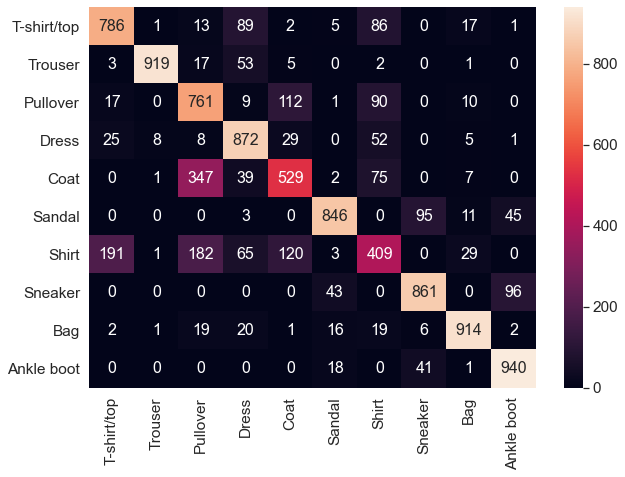

In [6]:
#Create the class
LR = LogisticRegression()
#Set my optimizer as Stocastic Gradient Descent and set hyper params, weight decay makes this L2 regularised
optimizerLR = optim.SGD(LR.parameters(), lr=0.001, momentum=0.9, weight_decay=0.001)
#Set the criterion
criterionLR = nn.CrossEntropyLoss()

#Train the model
epochs = 5
train_model = fit(LR, criterionLR, epochs, optimizerLR,trainloader)

#Get the predictions needed for results
train_output = train_model.get_all_preds(trainloader_ns)
test_output = train_model.get_all_preds(testloader)

#Get ground truth labels
x_true = (trainset.targets).numpy()
y_true = (testset.targets).numpy()

#Print asked for results
train_acc = accuracy(train_output,x_true)
test_acc = accuracy(test_output,y_true)
print("M1", train_acc)
print("M2", test_acc)

#print Confusion Matrix
conf_matrix(y_true, test_output)

acc_train_list.append(train_acc)
acc_test_list.append(test_acc)

B2.3 Logistic regression [4 marks] - Part C

In [7]:
#Create a new class for L1 regulaiser
class LassoLogisticRegression(torch.nn.Module):

    #Create the model with one basic layer, 10 class outputs
    def __init__(self): 
        super(LassoLogisticRegression, self).__init__()
        self.linear = torch.nn.Linear(28*28, 10)     
    
    #Create our forward pass learning step
    def forward(self, x):
        #Flatten the image
        x = x.reshape(-1, 784)
        y_pred = torch.sigmoid(self.linear(x))
        return y_pred

    #Train the model with the batch
    def train(self, batch, criterion):
        #Split the batch
        images, labels = batch
        #Generate the predictions
        y_pred = self(images)
        #Calcualte our loss
        #####Implement L1 regulaiser
        reg_loss = torch.tensor(0., requires_grad=True)
        #Apply across all weights
        for param in self.parameters():
                reg_loss = reg_loss + torch.norm(param, 1)
        #L1 factor
        factor = 0.0005
        clasify_loss = criterion(y_pred, labels)
        #Add to our loss function
        loss = clasify_loss + (factor * reg_loss)
        return loss

    #Get the predictions of a dataset using the model
    def get_all_preds(self, data):
        with torch.no_grad():
            total_preds = []
            for batch in data:
                images, labels = batch
                y_pred = self(images)
                _, predicted = torch.max(y_pred, 1)
                predicted = predicted.numpy()
                total_preds.append(predicted)
        return np.concatenate(total_preds).ravel()

10876.277364373207
10571.564544439316
10518.179919362068
10492.144646048546
10475.426970720291
Finished Training!
M3 - Time taken to train is: 0:00:42.144209
M4 - Total trainable params is: 7850
M1 The accuracy is: 78.91666666666667%
M2 The accuracy is: 78.03999999999999%


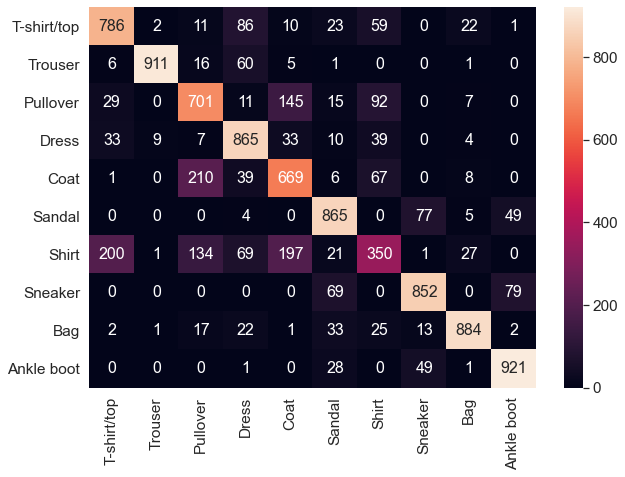

In [8]:
#Create the class
LLR = LassoLogisticRegression()
#Set my optimizer as Stocastic Gradient Descent and set hyper params
optimizerLLR = optim.SGD(LLR.parameters(), lr=0.001, momentum=0.9)
#Set the criterion
criterionLLR = nn.CrossEntropyLoss()

#Train the model
epochs = 5
train_model = fit(LLR, criterionLLR, epochs, optimizerLLR, trainloader)

#Get the predictions needed for results
train_output = train_model.get_all_preds(trainloader_ns)
test_output = train_model.get_all_preds(testloader)

#Get ground truth labels
x_true = (trainset.targets).numpy()
y_true = (testset.targets).numpy()

#Print asked for results
train_acc = accuracy(train_output,x_true)
test_acc = accuracy(test_output,y_true)
print("M1", train_acc)
print("M2", test_acc)

#print Confusion Matrix
conf_matrix(y_true, test_output)

acc_train_list.append(train_acc)
acc_test_list.append(test_acc)

B2.4 Neural networks (6 marks) - Part A

In [9]:
#Create a CNN class to use for part A
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 8, 5) #3: #input channels; 6: #output channels; 5: kernel size
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(8, 16, 5)
        self.fc1 = nn.Linear(16 * 4 * 4, 200)
        self.fc2 = nn.Linear(200, 10)

    def forward(self, x):
        x = self.pool(F.tanh(self.conv1(x)))
        x = self.pool(F.tanh(self.conv2(x)))
        x = x.view(-1, 16 * 4 * 4)
        x = F.tanh(self.fc1(x))
        x = self.fc2(x)
        return x             

    #Train the model with the batch
    def train(self, batch, criterion):
        #Split the batch
        images, labels = batch
        #Generate the predictions
        y_pred = self(images)
        #Calcualte our loss
        loss = criterion(y_pred, labels)
        return loss

    #Get the predictions of a dataset using the model
    def get_all_preds(self, data):
        with torch.no_grad():
            total_preds = []
            for batch in data:
                images, labels = batch
                y_pred = self(images)
                _, predicted = torch.max(y_pred, 1)
                predicted = predicted.numpy()
                total_preds.append(predicted)
        return np.concatenate(total_preds).ravel()                                                                                                                  

3973.7515051588416
2400.3393711447716
2130.679468501825
1975.4249927648343
1851.9261189794634
Finished Training!
M3 - Time taken to train is: 0:02:22.988676
M4 - Total trainable params is: 56834
M1 The accuracy is: 89.63333333333333%
M2 The accuracy is: 88.59%


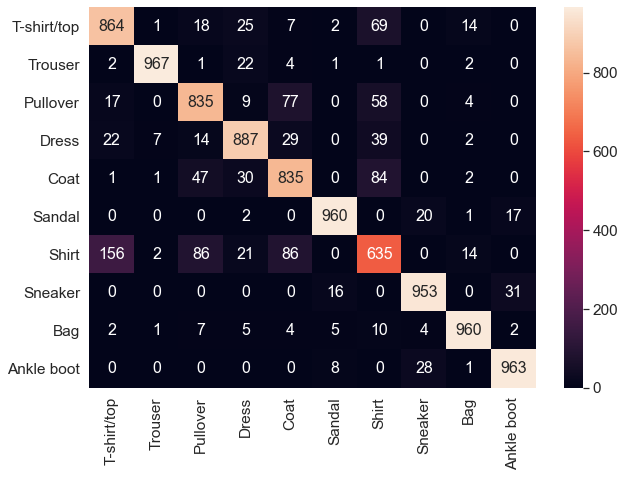

In [10]:
myCNN = CNN()

#Set my optimizer as Stocastic Gradient Descent and set hyper params
optimizerCNN = optim.SGD(myCNN.parameters(), lr=0.001, momentum=0.9)
#Set the criterion
criterionCNN = nn.CrossEntropyLoss()

#Train the model
epochs = 5
train_model = fit(myCNN, criterionCNN, epochs, optimizerCNN, trainloader)

#Get the predictions needed for results
train_output = train_model.get_all_preds(trainloader_ns)
test_output = train_model.get_all_preds(testloader)

#Get ground truth labels
x_true = (trainset.targets).numpy()
y_true = (testset.targets).numpy()

#Print asked for results
train_acc = accuracy(train_output,x_true)
test_acc = accuracy(test_output,y_true)
print("M1", train_acc)
print("M2", test_acc)

#print Confusion Matrix
conf_matrix(y_true, test_output)

acc_train_list.append(train_acc)
acc_test_list.append(test_acc)

B2.4 Neural networks (6 marks) - Part B

In [11]:
#Create a CNN class to use for part B
class CNN_4conv_2fc(nn.Module):
    def __init__(self):
        super(CNN_4conv_2fc, self).__init__()
        self.conv1 = nn.Conv2d(1, 8, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(8, 16, 3)
        self.conv3 = nn.Conv2d(16, 32, 2)
        self.conv4 = nn.Conv2d(32, 64, 2)
        self.fc1 = nn.Linear(64 * 3 * 3, 200)
        self.fc2 = nn.Linear(200, 10)

    def forward(self, x):
        x = self.pool(F.tanh(self.conv1(x)))
        x = self.pool(F.tanh(self.conv2(x)))
        #Don't pool these layers
        x = F.tanh(self.conv3(x))
        x = F.tanh(self.conv4(x))
        x = x.view(-1, 64 * 3 * 3)
        x = F.tanh(self.fc1(x))
        x = self.fc2(x)
        return x             

    #Train the model with the batch
    def train(self, batch, criterion):
        #Split the batch
        images, labels = batch
        #Generate the predictions
        y_pred = self(images)
        #Calcualte our loss
        loss = criterion(y_pred, labels)
        return loss

    #Get the predictions of a dataset using the model
    def get_all_preds(self, data):
        with torch.no_grad():
            total_preds = []
            for batch in data:
                images, labels = batch
                y_pred = self(images)
                _, predicted = torch.max(y_pred, 1)
                predicted = predicted.numpy()
                total_preds.append(predicted)
        return np.concatenate(total_preds).ravel() 

4730.062840744853
2893.149697707966
2445.8931619171053
2192.074631245574
2025.5232660663314
Finished Training!
M3 - Time taken to train is: 0:03:15.460098
M4 - Total trainable params is: 129122
M1 The accuracy is: 88.32666666666667%
M2 The accuracy is: 87.17%


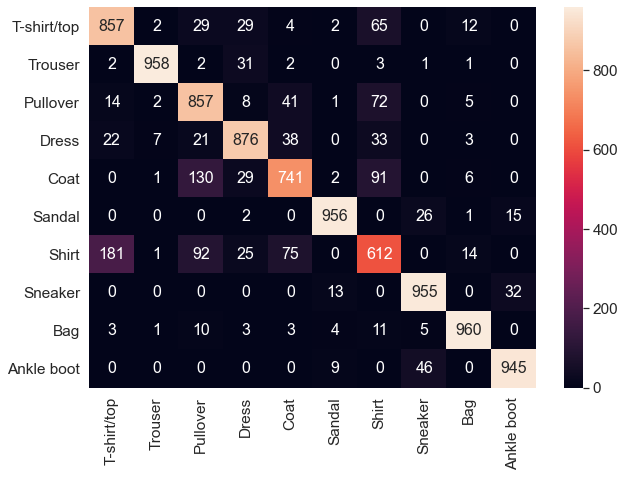

In [12]:
myCNN = CNN_4conv_2fc()

#Set my optimizer as Stocastic Gradient Descent and set hyper params
optimizerCNN = optim.SGD(myCNN.parameters(), lr=0.001, momentum=0.9)
#Set the criterion
criterionCNN = nn.CrossEntropyLoss()

#Train the model
epochs = 5
train_model = fit(myCNN, criterionCNN, epochs, optimizerCNN, trainloader)

#Get the predictions needed for results
train_output = train_model.get_all_preds(trainloader_ns)
test_output = train_model.get_all_preds(testloader)

#Get ground truth labels
x_true = (trainset.targets).numpy()
y_true = (testset.targets).numpy()

#Print asked for results
train_acc = accuracy(train_output,x_true)
test_acc = accuracy(test_output,y_true)
print("M1", train_acc)
print("M2", test_acc)

#print Confusion Matrix
conf_matrix(y_true, test_output)

acc_train_list.append(train_acc)
acc_test_list.append(test_acc)

B2.4 Neural networks (6 marks) - Part C

In [13]:
#Create a CNN class to use for part C
class CNN_2conv_4fc(nn.Module):
    def __init__(self):
        super(CNN_2conv_4fc, self).__init__()
        self.conv1 = nn.Conv2d(1, 8, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(8, 16, 3)
        self.fc1 = nn.Linear(16 * 5 * 5, 200)
        self.fc2 = nn.Linear(200, 150)
        self.fc3 = nn.Linear(150, 150)
        self.fc4 = nn.Linear(150, 10)

    def forward(self, x):
        x = self.pool(F.tanh(self.conv1(x)))
        x = self.pool(F.tanh(self.conv2(x)))
        x = x.view(-1, 16 * 5 * 5)
        x = F.tanh(self.fc1(x))
        x = F.tanh(self.fc2(x))
        x = F.tanh(self.fc3(x))
        x = self.fc4(x)
        return x             

    #Train the model with the batch
    def train(self, batch, criterion):
        #Split the batch
        images, labels = batch
        #Generate the predictions
        y_pred = self(images)
        #Calcualte our loss
        loss = criterion(y_pred, labels)
        return loss

    #Get the predictions of a dataset using the model
    def get_all_preds(self, data):
        with torch.no_grad():
            total_preds = []
            for batch in data:
                images, labels = batch
                y_pred = self(images)
                _, predicted = torch.max(y_pred, 1)
                predicted = predicted.numpy()
                total_preds.append(predicted)
        return np.concatenate(total_preds).ravel() 

4468.286403764039
2542.5220943633467
2169.7801145887934
1968.2657615835778
1834.814152987441
Finished Training!
M3 - Time taken to train is: 0:03:03.998485
M4 - Total trainable params is: 135886
M1 The accuracy is: 89.18833333333333%
M2 The accuracy is: 88.26%


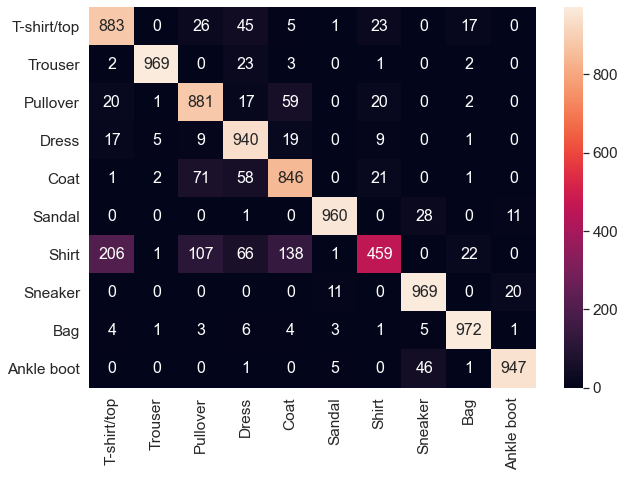

In [14]:
myCNN = CNN_2conv_4fc()

#Set my optimizer as Stocastic Gradient Descent and set hyper params
optimizerCNN = optim.SGD(myCNN.parameters(), lr=0.001, momentum=0.9)
#Set the criterion
criterionCNN = nn.CrossEntropyLoss()

#Train the model
epochs = 5
train_model = fit(myCNN, criterionCNN, epochs, optimizerCNN, trainloader)

#Get the predictions needed for results
train_output = train_model.get_all_preds(trainloader_ns)
test_output = train_model.get_all_preds(testloader)

#Get ground truth labels
x_true = (trainset.targets).numpy()
y_true = (testset.targets).numpy()

#Print asked for results
train_acc = accuracy(train_output,x_true)
test_acc = accuracy(test_output,y_true)
print("M1", train_acc)
print("M2", test_acc)

#print Confusion Matrix
conf_matrix(y_true, test_output)

acc_train_list.append(train_acc)
acc_test_list.append(test_acc)

B2.4 Performance comparison (2 marks) - Part A

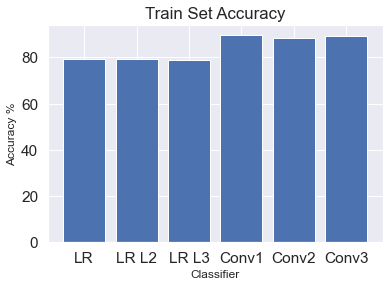

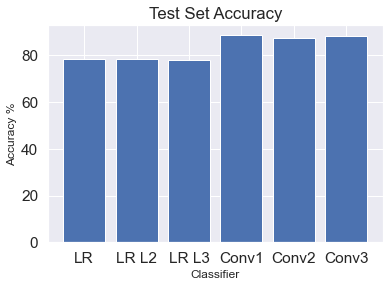

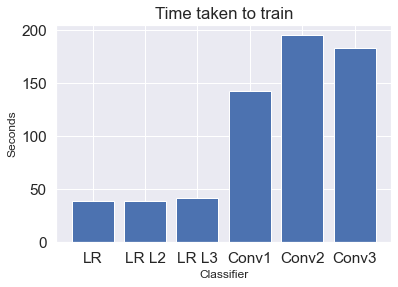

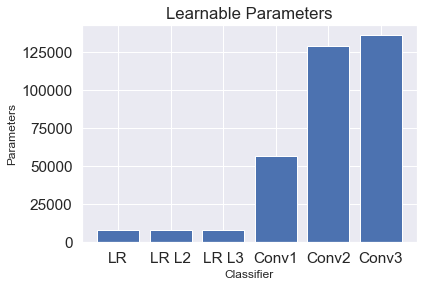

In [15]:
#Pre-proccess some data to make it displayable
acc_train_list_numbers = []
for each in acc_train_list:
    x = each.split()
    val = float(x[3][0:4])
    acc_train_list_numbers.append(val)

acc_test_list_numbers = []
for each in acc_test_list:
    x = each.split()
    val = float(x[3][0:4])
    acc_test_list_numbers.append(val)

time_list_numbers = []
for each in time_list:
    x = each.seconds
    time_list_numbers.append(x)

label = ["LR", "LR L2", "LR L3", "Conv1", "Conv2", "Conv3"]
ylabels = ["Accuracy %", "Accuracy %", "Seconds", "Parameters"]
titles = ["Train Set Accuracy", "Test Set Accuracy", "Time taken to train", "Learnable Parameters"]
data_list = [acc_train_list_numbers, acc_test_list_numbers, time_list_numbers, params_count_list]

for i in (range(len(data_list))):
    plt.bar(label, data_list[i])
    plt.xlabel('Classifier', fontsize=12)
    plt.ylabel(ylabels[i], fontsize=12)
    plt.title(titles[i])
    plt.show()

B2.4 Performance comparison (2 marks) - Part B

Observation 1

I found it interesting that over the same epochs the nets with more learnable paramaters performed worse than the ones with less. I believe this is due to the network needing more time to learn as there are more paramaters to be trained. With more time I would expect these to improve drastically. The network with more 'normal' layers also learnt a lot faster, showing this could be impacting.

Observation 2

I was impressed by how well the logistc regression performed over the dataset. To be only around 10% lower than a nueral network that was drastically more complicated was impressive. The training time is also drastically faster, so over a larger dataset if accuracy was not as critical as time, this could make a good trade off as there is less time for each epoch.

B3. Unsupervised learning on Fashion-MNIST [12 marks]

B3.1 PCA and k-means [8 marks] - Part A

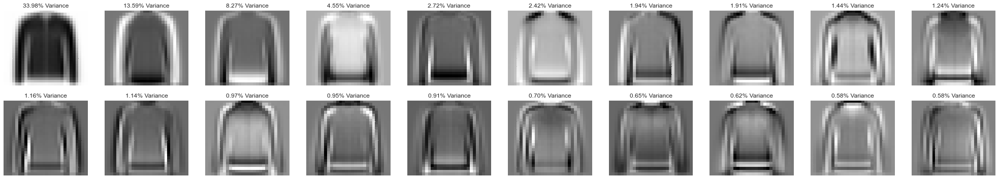

In [16]:
#Import PCA
from sklearn.decomposition import PCA

#Load the training data for my first class
trainset_class_1 = datasets.FashionMNIST(root='./data', train=True,
                                        download=True, transform=transform)

#Load the training data for my second class
trainset_class_2 = datasets.FashionMNIST(root='./data', train=True,
                                        download=True, transform=transform)

#Select the class that is a pullover
idx = trainset.targets==2

trainset_class_1.targets = trainset.targets[idx]
trainset_class_1.data = trainset.data[idx]

#Select the class that is a coat
idx = trainset.targets==4

trainset_class_2.targets = trainset.targets[idx]
trainset_class_2.data = trainset.data[idx]

#Flatten the class data
class1_data = torch.flatten(trainset_class_1.data, start_dim=1)
class2_data = torch.flatten(trainset_class_2.data, start_dim=1)

#Make a tensor with all the data
all_data = torch.cat([class1_data,class2_data])

#Run PCA and get the 20 components
pca = PCA(n_components=20)
out = pca.fit(all_data).transform(all_data)

#Create the plot
fig, axarr = plt.subplots(2, 10, figsize=(35, 6))

col = 0
row = 0
for i in range(len(pca.components_)):
    if col >9:
        col = 0
        row = 1
    #Print the varience captured
    axarr[row][col].set_title("{0:.2f}% Variance".format(pca.explained_variance_ratio_[i]*100),fontsize=12)
    #Heatmap it
    sn.heatmap(pca.components_[i, :].reshape(28, 28), ax=axarr[row][col], cmap='gray', yticklabels=False, xticklabels=False,cbar=False)
    col+=1

B3.1 PCA and k-means [8 marks] - Part B

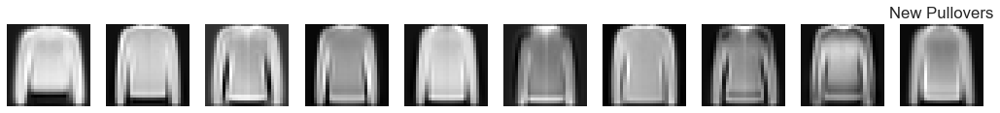

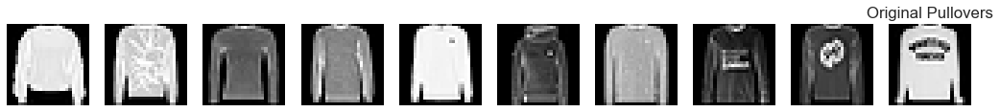

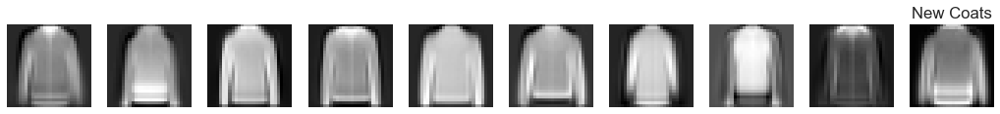

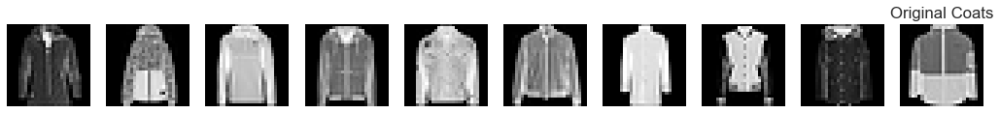

The total loss is: 1415.6267550337611


In [17]:
#Reverse the PCA to get new originals
reverse = pca.inverse_transform(out)

#Print pullovers new
fig = plt.figure(figsize=(18,2))
columns = 10
rows = 1

for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    plt.axis('off')
    plt.imshow(reverse[i].reshape(28,28), cmap='gray')
plt.title("New Pullovers")
plt.show() 

#Print pullovers old
fig = plt.figure(figsize=(18,2))
columns = 10
rows = 1

for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    plt.axis('off')
    plt.imshow(all_data[i].reshape(28,28), cmap='gray')
plt.title("Original Pullovers")
plt.show() 

#Print coats new
fig = plt.figure(figsize=(18,2))
columns = 10
rows = 1

for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    plt.axis('off')
    #Add 6K as entries 0-5999 are jumpers
    plt.imshow(reverse[5999 + i].reshape(28,28), cmap='gray')
plt.title("New Coats")
plt.show()

#Print coats old
fig = plt.figure(figsize=(18,2))
columns = 10
rows = 1

for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    plt.axis('off')
    #Add 6K as entries 0-5999 are jumpers
    plt.imshow(all_data[5999 + i].reshape(28,28), cmap='gray')
plt.title("Original Coats")
plt.show()

#Create tensors for the new images
class1_images = torch.from_numpy(reverse[0:10])
class2_images = torch.from_numpy(reverse[6000:6010])

#Get the old images
original_class1_images = all_data[0:10]
original_class2_images = all_data[6000:6010]

#Import the loss function
loss = nn.MSELoss()

#Calculate the loss per class
mse_class1 = loss(class1_images, original_class1_images)
mse_class2 = loss(class2_images, original_class2_images)

#Overall loss
overall_loss = mse_class1.item() + mse_class2.item()

print("The total loss is:", overall_loss)

B3.1 PCA and k-means [8 marks] - Part C

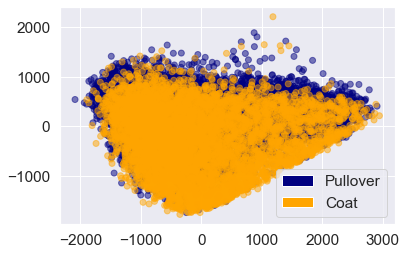

In [18]:
import matplotlib.patches as mpatches

#Set up class names
class1_label = classes[trainset_class_1.targets[0]]
class2_label = classes[trainset_class_2.targets[0]]
target_names = [class1_label,class2_label]
all_labels = torch.cat([trainset_class_1.targets,trainset_class_2.targets])

#Colours
colour_list = ['navy', 'orange']
#Make all coats orange, pullovers blue
colors = [colour_list[0] if label == 2 else colour_list[1] for label in all_labels]

#Redo PCA with 2 components
pca = PCA(n_components=2)
X_r = pca.fit(all_data).transform(all_data)

#Scatter
plt.scatter(X_r[:,0],X_r[:,1],c=colors, marker='o',alpha =0.5)
#Make a legend
recs = []
for i in range(0,len(colour_list)):
    recs.append(mpatches.Rectangle((0,0),1,1,fc=colour_list[i]))
plt.legend(recs,target_names,loc=4)
#Show off
plt.show()

B3.1 PCA and k-means [8 marks] - Part D

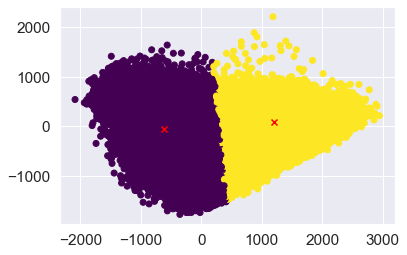

In [19]:
from sklearn.cluster import KMeans

#Do K-Means
kmeans = KMeans(init='k-means++', n_clusters=2, n_init=10)
kmeans.fit(X_r)

y_kmeans = kmeans.predict(X_r)
centers = kmeans.cluster_centers_

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)

#Get the cluster co-ords
x_centres = [kmeans.cluster_centers_[0][0], kmeans.cluster_centers_[1][0]]
y_centres = [kmeans.cluster_centers_[1][0], kmeans.cluster_centers_[1][1]]
#Scatter
ax.scatter(X_r[:,0],X_r[:,1],c=y_kmeans, marker='o',cmap='viridis')
#Scatter the cluster centres
ax.scatter(centers[:,0], centers[:,1], c='red',marker='x')
#Show off
plt.show()

B3.2 AutoEncoder [3 marks]

In [20]:
#Declare an Autoencoder class
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 8, 3),
            nn.Tanh(),
            nn.Conv2d(8, 16, 3),
            nn.Tanh(),
            nn.Conv2d(16, 32, 3),
            nn.Tanh(),
            nn.Conv2d(32, 64, 3),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(64, 32, 3),
            nn.Tanh(),
            nn.ConvTranspose2d(32, 16, 3),
            nn.Tanh(),
            nn.ConvTranspose2d(16, 8, 3),
            nn.Tanh(),
            nn.ConvTranspose2d(8, 1, 3),
            nn.Sigmoid()  #to range [0, 1]
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

Design a new autoencoder with four Conv2d layers and four ConvTranspose2d layers. You are free to choose the activation functions and settings such as stride and padding. Train this new autoencoder on all images of these two chosen classes for at least 10 epochs. Plot the mean squared error against the epoch. [2 marks]

Epoch:1, Loss:0.4646
Epoch:2, Loss:0.4477
Epoch:3, Loss:0.4422
Epoch:4, Loss:0.4399
Epoch:5, Loss:0.4378
Epoch:6, Loss:0.4360
Epoch:7, Loss:0.4350
Epoch:8, Loss:0.4350
Epoch:9, Loss:0.4338
Epoch:10, Loss:0.4340


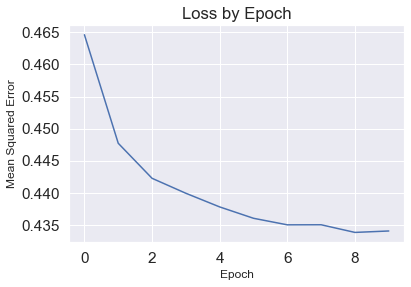

In [21]:
#Load the training data
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
trainset = datasets.FashionMNIST(root='./data', train=True,
                                        download=True, transform=transform)
auto_encoder_train = trainset

def conv_calc(i,f,p,s):
    return (i-f + 2*p)/s + 1

#l1 = conv_calc(28,2,)

chosen_classes = [True if class_l == 4 or class_l == 2 else False for class_l in auto_encoder_train.targets]

auto_encoder_train.data = auto_encoder_train.data[chosen_classes]
auto_encoder_train.targets = auto_encoder_train.targets[chosen_classes]

batch_size=60
learning_rate=1e-3
max_epochs = 10

auto_encoder_trainloader = torch.utils.data.DataLoader(auto_encoder_train, shuffle=False, batch_size=batch_size)

myAE = Autoencoder()

#Choose mean square error loss
criterion = nn.MSELoss() 
#Choose the Adam optimiser
optimizer = torch.optim.Adam(myAE.parameters(), lr=learning_rate, weight_decay=1e-5)
#Storage
outputs = []
loss_list =[]
#Start training
for epoch in range(max_epochs):
    batch_count = 0
    for data in auto_encoder_trainloader:
        batch_count +=1
        img, label = data
        optimizer.zero_grad()
        recon = myAE(img)
        if epoch == (max_epochs - 1):
            if batch_count == 1:
                coat_count = 0
                pull_count = 0
                pull_image_list = []
                coat_image_list = []
                recon_pull_list = []
                recon_coat_list = []
                for l in range(len(label)):
                    if label[l] == 2 and pull_count < 10:
                        pull_image_list.append(img[l])
                        recon_pull_list.append(recon[l]) 
                    if label[l] == 4 and coat_count < 10:
                        coat_image_list.append(img[l])
                        recon_coat_list.append(recon[l])
        loss = criterion(recon, img)
        loss.backward()
        optimizer.step()            
    print('Epoch:{}, Loss:{:.4f}'.format(epoch+1, float(loss)))
    outputs.append((epoch, img, recon),)
    loss_list.append(loss)
plt.title("Loss by Epoch")
plt.xlabel('Epoch', fontsize=12)
plt.ylabel("Mean Squared Error", fontsize=12)
plt.plot(loss_list)

Show 20 pairs of reconstructed and original images as in B3.1b, for the same 20 chosen images as in B3.1b. [1 mark]

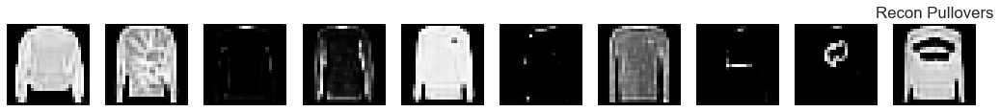

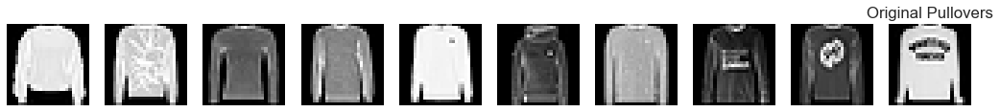

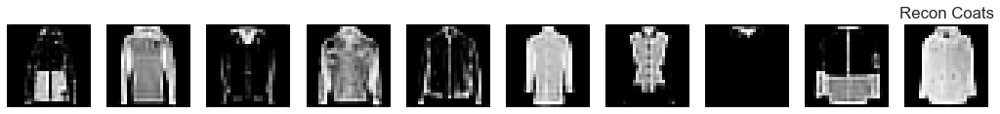

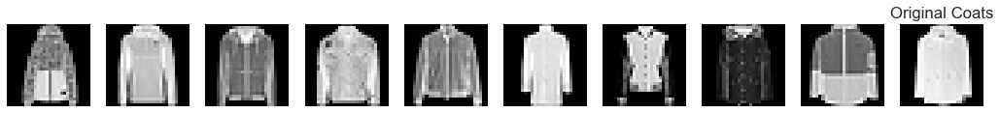

In [22]:
#Print pullovers new
fig = plt.figure(figsize=(18,2))
columns = 10
rows = 1

for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    plt.axis('off')
    plt.imshow(recon_pull_list[i].detach().numpy().reshape(28,28), cmap='gray')
plt.title("Recon Pullovers")
plt.show() 

#Print pullovers old
fig = plt.figure(figsize=(18,2))
columns = 10
rows = 1

for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    plt.axis('off')
    plt.imshow(pull_image_list[i].detach().numpy().reshape(28,28), cmap='gray')
plt.title("Original Pullovers")
plt.show() 

#Print coats new
fig = plt.figure(figsize=(18,2))
columns = 10
rows = 1

for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    plt.axis('off')
    #Add 6K as entries 0-5999 are jumpers
    plt.imshow(recon_coat_list[i].detach().numpy().reshape(28,28), cmap='gray')
plt.title("Recon Coats")
plt.show()

#Print coats old
fig = plt.figure(figsize=(18,2))
columns = 10
rows = 1

for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    plt.axis('off')
    #Add 6K as entries 0-5999 are jumpers
    plt.imshow(coat_image_list[i].detach().numpy().reshape(28,28), cmap='gray')
plt.title("Original Coats")
plt.show()

B3.3 Observation [1 marks]


Observation 1 -

The two classes I selected are far too close to each other. This can be seen my the scatter plot above but with their 2 main componenets they basically overlap each other. This means the K-Means Classifier has performed terribly on the data, as it is basically impossible to tell them apart by these features. This makes it a very poor choice for using on these classes with this data

Observation 2 -

The Auto-Encoder does a much better job at reconstucting the images and detecting areas that seperate the two types of object. The PCAs are really not identifable from each other where as the AE ones you can make clear seperation between. This can also be seen in the signficantly lower value of loss.